In [7]:
from pathlib import Path
import os, shutil
import zipfile
import tarfile
import glob

import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import logging
import datetime as dt

import gc
import cartopy.crs as ccrs



import grstbx
from grstbx import visual
ust = grstbx.utils.spatiotemp()
opj = os.path.join


print(f'-grstbx: {grstbx.__version__}')

-s2driver: 1.0.4
-grs: 2.1.4
-grstbx: 2.0.2


### Multitemporal data cube

In [2]:
l2adir = '/data/satellite/Sentinel-2/projet/robert/L2A'
l2a_files = sorted(glob.glob(opj(l2adir,'*','S2*')))
l2a_files


['/data/satellite/Sentinel-2/projet/robert/L2A/2018/S2A_MSIL2A_20180422T102031_N0500_R065_T30PYT_20230724T192904',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2018/S2A_MSIL2A_20180711T102021_N0500_R065_T30PYT_20230820T115032',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2018/S2A_MSIL2A_20180929T102021_N0500_R065_T30PYT_20230709T130641',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2018/S2A_MSIL2A_20181019T102031_N0500_R065_T30PYT_20230815T043850',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2018/S2B_MSIL2A_20180924T102019_N0500_R065_T30PYT_20230823T162156',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2018/S2B_MSIL2A_20181004T102019_N0500_R065_T30PYT_20230619T144241',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2019/S2A_MSIL2A_20190107T102411_N0500_R065_T30PYT_20221218T192912',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2019/S2A_MSIL2A_20190407T102021_N0500_R065_T30PYT_20221018T142307',
 '/data/satellite/Sentinel-2/projet/robert/L2A/2019/S2A_MSIL2A_20190417T102031_N

In [3]:
# generate datacube
dc = grstbx.l2grs(l2a_files)
dc.get_l2a_datacube()

In [6]:
dc.datacube

<xarray.Dataset>
Dimensions:             (time: 31, wl: 11, y: 1818, x: 2523)
Coordinates:
  * wl                  (wl) int64 443 490 560 665 705 740 783 842 865 1610 2190
  * time                (time) datetime64[ns] 2018-04-22T10:20:31.026000 ... ...
  * x                   (x) float64 7.299e+05 7.299e+05 ... 7.803e+05 7.804e+05
  * y                   (y) float64 1.3e+06 1.3e+06 ... 1.264e+06 1.264e+06
    spatial_ref         int64 0
    central_wavelength  (time, wl) float64 442.7 492.7 ... 1.61e+03 2.186e+03
Data variables:
    Rrs                 (time, wl, y, x) float32 nan nan nan nan ... nan nan nan
    BRDFg               (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    aot550              (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    vza                 (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    sza                 (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    raa                 (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    wv_band             (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    cirrus_band         (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    ndwi                (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    ndwi_swir           (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    surfwater           (time, y, x) int8 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    valid_pix_prop      (time) float64 0.0431 0.03889 0.1261 ... 0.109 0.108
Attributes: (12/70)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/30PYT...
    product_name:                        S2A_MSIL1C_20180422T102031_N0500_R06...
    product_filename:                    S2A_MSIL1C_20180422T102031_N0500_R06...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2018-04-22T10:20:31.026000000
    stop_date:                           2019-12-28T10:23:39.024000000

In [5]:
dc.datacube.Rrs.load()

<xarray.DataArray 'Rrs' (time: 31, wl: 11, y: 1818, x: 2523)>
array([[[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]],

        [[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
...
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [ 0.02058002,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]],

        [[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [-0.00907999,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]]]], dtype=float32)
Coordinates:
  * wl                  (wl) int64 443 490 560 665 705 740 783 842 865 1610 2190
  * time                (time) datetime64[ns] 2018-04-22T10:20:31.026000 ... ...
  * x                   (x) float64 7.299e+05 7.299e+05 ... 7.803e+05 7.804e+05
  * y                   (y) float64 1.3e+06 1.3e+06 ... 1.264e+06 1.264e+06
    spatial_ref         int64 0
    central_wavelength  (time, wl) float64 442.7 492.7 ... 1.61e+03 2.186e+03

In [8]:
str_epsg = str(dc.datacube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south) 

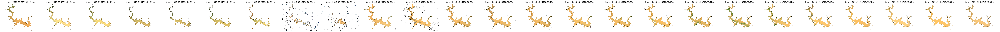

In [21]:
# WARNING bug when using col_wrap for big datacube ????!!!!
im=dc.datacube.Rrs.isel(wl=[3,2,1]).plot.imshow(rgb='wl', col='time',robust=True, subplot_kws=dict(projection=proj,frame_on=False) )

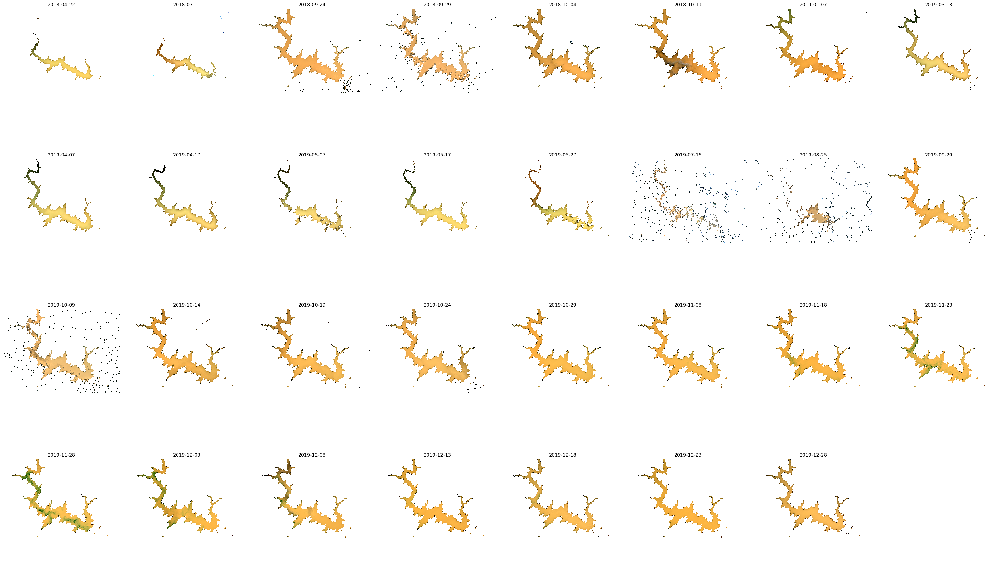

In [20]:
RGB = dc.datacube.Rrs.isel(wl=[3,2,1])#.isel(time=[0,1,2,3])

ncols=8

dates =  RGB.time

Ndates = len(dates.values)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*4.9,5*nrows+5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.15, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]
for ii,(date, xraster_) in enumerate(RGB.groupby('time')):
    date = pd.to_datetime(str(date)) 
    date_ = date.strftime('%Y-%m-%d')
  
    xraster_.plot.imshow(ax=axs[ii],robust=True)
    axs[ii].set_title(date_)

### Total suspended particulate matter (SPM) from Nechad et al., 2010, 2016 formulation
### spm in mg/L

In [10]:
Rrs = dc.datacube.Rrs
a = [760, 1.3]
ratio = Rrs.sel(wl=865,method='nearest')/Rrs.sel(wl=565,method='nearest')
spm = a[0] * np.exp(a[1]*ratio)
spm.name='SPM_EA_BR1'
spm.attrs['units']='mg/L'
spm.attrs['description']='Concentration of suspended particulate matter from band ratio 865 over 565 nm'
#spm= spm.where((spm >= 0) & (spm <= 50000))
a = [1.378, 4.246]
ratio = Rrs.sel(wl=705,method='nearest')/Rrs.sel(wl=565,method='nearest')
spm2 = a[0] * np.exp(a[1]*ratio)
spm2.name='SPM_EA_BR2'
spm2.attrs['units']='mg/L'
spm2.attrs['description']='Concentration of suspended particulate matter from band ratio 705 over 565 nm'

a = [6.384, 3.215,-57.7]
ratio = Rrs.sel(wl=705,method='nearest')/Rrs.sel(wl=565,method='nearest')
spm3 = a[0] * np.exp(a[1]*ratio)+a[2]
spm3.name='SPM_EA_BR3'
spm3.attrs['units']='mg/L'
spm3.attrs['description']='Concentration of suspended particulate matter from band ratio 705 over 565 nm'

a = [211.43, 1.07,-268]
ratio = Rrs.sel(wl=740,method='nearest')/Rrs.sel(wl=565,method='nearest')
spm4 = a[0] * np.exp(a[1]*ratio)+a[2]
spm4.name='SPM_EA_BR4'
spm4.attrs['units']='mg/L'
spm4.attrs['description']='Concentration of suspended particulate matter from band ratio 740 over 565 nm'

l2b_spm = xr.merge([spm,spm2,spm3,spm4])

l2b_spm = l2b_spm.compute()

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: overflow encountered in exp
  result_data = func(*input_data)
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: overflow encountered in exp
  result_data = func(*input_data)
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: overflow encountered in exp
  result_data = func(*input_data)
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: overflow encountered in exp
  result_data = func(*input_data)


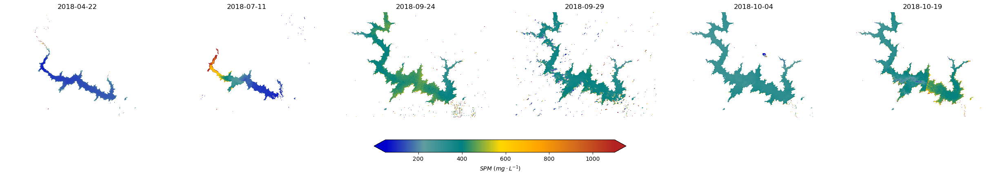

In [11]:

param = 'SPM_EA_BR3'
colors = ['mediumblue','cadetblue','teal','gold','orange','chocolate','firebrick']
cmap = mpl.colors.LinearSegmentedColormap.from_list('spm',colors)

im =l2b_spm[param].plot.imshow(col='time',col_wrap=6, size=4,
                               cmap=cmap,vmin=50,vmax=1100,
                               subplot_kws=dict(projection=proj,frame_on=False),
                               cbar_kwargs={"location": "bottom", 'shrink':0.25,'label':'$SPM\ (mg\cdot L^{-1})$'})
axs = im.axs.flat
for ii,(date, xraster_) in enumerate(l2b_spm.groupby('time')):
    date = pd.to_datetime(str(date)) 
    date_ = date.strftime('%Y-%m-%d')
    axs[ii].set_title(date_)




In [ ]:

param = 'SPM_EA_BR4'
colors = ['mediumblue','cadetblue','teal','gold','orange','chocolate','firebrick']
cmap = mpl.colors.LinearSegmentedColormap.from_list('spm',colors)

im =l2b_spm[param].plot.imshow(col='time',col_wrap=4,
                               cmap=cmap,vmin=50,vmax=1100,
                               subplot_kws=dict(projection=proj,frame_on=False),
                               cbar_kwargs={"location": "bottom", 'shrink':0.25,'label':'$SPM\ (mg\cdot L^{-1})$'})
axs = im.axs.flat
for ii,(date, xraster_) in enumerate(l2b_spm.groupby('time')):
    date = pd.to_datetime(str(date)) 
    date_ = date.strftime('%Y-%m-%d')
    axs[ii].set_title(date_)




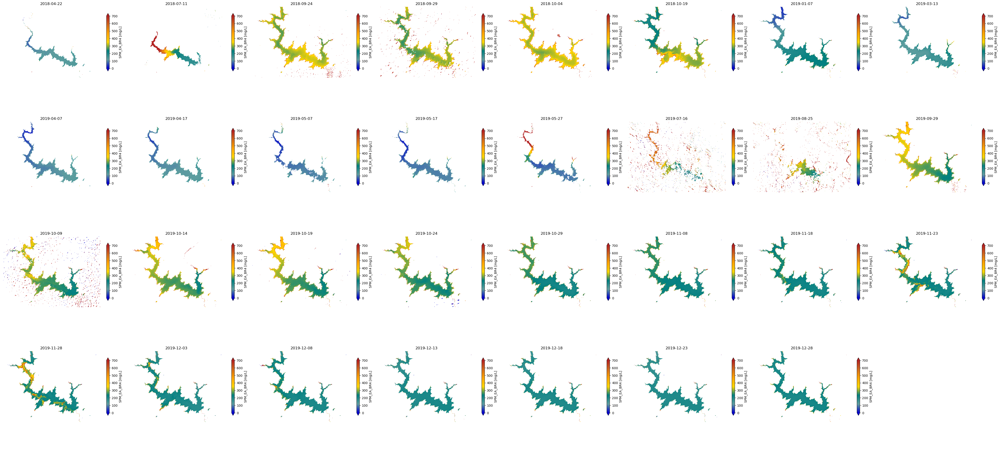

In [21]:

param = 'SPM_EA_BR4'
colors = ['mediumblue','cadetblue','teal','gold','orange','chocolate','firebrick']
cmap = mpl.colors.LinearSegmentedColormap.from_list('spm',colors)
ncols=8
xcube = l2b_spm[param]
dates =  xcube.time

Ndates = len(dates.values)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*5.5,4*nrows+5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]
for ii,(date, xraster_) in enumerate(xcube.groupby('time')):
    date = pd.to_datetime(str(date)) 
    date_ = date.strftime('%Y-%m-%d')
  
    xraster_.plot.imshow(ax=axs[ii], cmap=cmap,vmin=0,vmax=700,cbar_kwargs={'shrink':0.45},add_colorbar=True)
    axs[ii].set_title(date_)
#cbar_ax = fig.add_axes([0.3, 0.0, 0.4, 0.02])  # Left, bottom, width, height.
#cbar = fig.colorbar(im, cax=cbar_ax, extend='both', orientation='horizontal')
#cbar.set_label('$SPM\ (mg\cdot L^{-1})$')
plt.tight_layout()

Text(0.5, 1.0, ' 6.384 exp(3.215 ratio(705/565)) -57.7, from in situ data')

<Figure size 2500x1800 with 0 Axes>

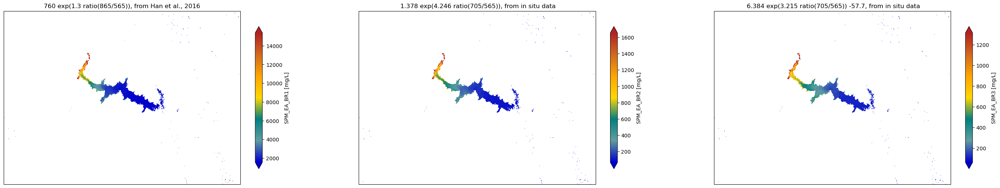

In [59]:
plt.figure(figsize=(25,18))
colors = ['mediumblue','cadetblue','teal','gold','orange','chocolate','firebrick']
cmap = mpl.colors.LinearSegmentedColormap.from_list('spm',colors)
fig = plt.figure(figsize=(35, 20))
ax = plt.subplot(1, 3, 1, projection=proj)
spm.plot.imshow(cmap=cmap,ax=ax,robust=True,cbar_kwargs={'shrink':0.25})
ax.set_title('760 exp(1.3 ratio(865/565)), from Han et al., 2016')
ax = plt.subplot(1, 3,2, projection=proj)
spm2.plot.imshow(cmap=cmap,ax=ax,robust=True,cbar_kwargs={'shrink':0.25})
ax.set_title(' 1.378 exp(4.246 ratio(705/565)), from in situ data')
ax = plt.subplot(1, 3,3, projection=proj)
spm3.plot.imshow(cmap=cmap,ax=ax,robust=True,cbar_kwargs={'shrink':0.25})
ax.set_title(' 6.384 exp(3.215 ratio(705/565)) -57.7, from in situ data')

In [12]:

vp=visual.view_param(l2b_spm,reproject=True)

In [14]:
vp.minmax=[0,1000]
vp.minmaxvalues=(30,300)
vp.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] Select(options=['SPM_EA_BR1', ...], value='SPM_EA_BR1')
                [1] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2018, ...], start=datetime.date(2018, ..., value=datetime.date(2018, ...)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [1] Row
                [0] EditableRangeSlider(end=1000, name='Range Slider', step=0.0001, value=(30, 300), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(DynamicMap, height=800, sizing_mode='fixed', width=1200)

In [35]:
xcube = l2b_spm
geom_ = vp.get_geom(vp.aoi_stream,crs=xcube.rio.crs)

xcube_clipped = xcube.rio.clip(geom_.geometry.values)

In [36]:
xcube_clipped

<xarray.Dataset>
Dimensions:      (time: 31, x: 569, y: 455)
Coordinates:
  * time         (time) datetime64[ns] 2018-04-22T10:20:31.026000 ... 2019-12...
  * x            (x) float64 7.382e+05 7.382e+05 ... 7.496e+05 7.496e+05
  * y            (y) float64 1.293e+06 1.293e+06 ... 1.284e+06 1.284e+06
    spatial_ref  int64 0
Data variables:
    SPM_EA_BR1   (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    SPM_EA_BR2   (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    SPM_EA_BR3   (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    SPM_EA_BR4   (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    units:        mg/L
    description:  Concentration of suspended particulate matter from band rat...

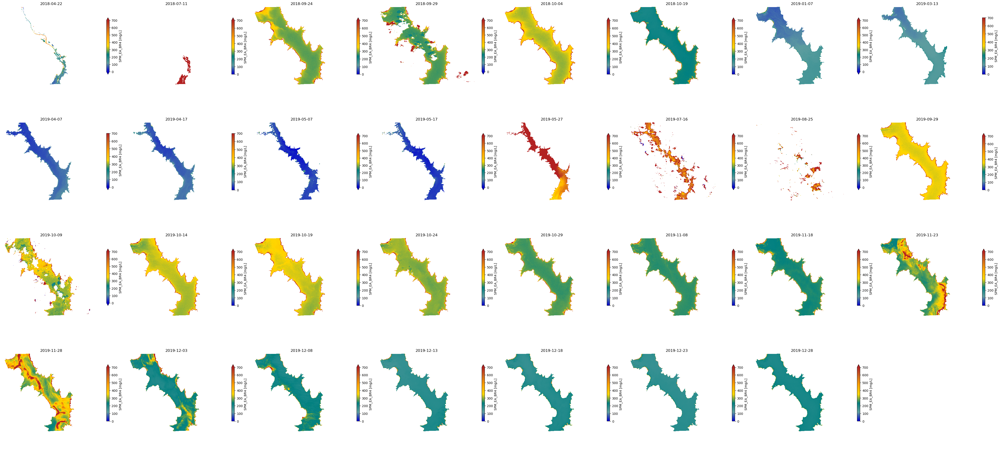

In [37]:

param = 'SPM_EA_BR4'
colors = ['mediumblue','cadetblue','teal','gold','orange','chocolate','firebrick']
cmap = mpl.colors.LinearSegmentedColormap.from_list('spm',colors)
ncols=8
xcube = xcube_clipped[param]
dates =  xcube.time

Ndates = len(dates.values)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*5.5,4*nrows+5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]
for ii,(date, xraster_) in enumerate(xcube.groupby('time')):
    date = pd.to_datetime(str(date)) 
    date_ = date.strftime('%Y-%m-%d')
  
    xraster_.plot.imshow(ax=axs[ii], cmap=cmap,vmin=0,vmax=700,cbar_kwargs={'shrink':0.45})
    axs[ii].set_title(date_)
plt.tight_layout()

In [38]:
import hvplot.xarray
datafile= '/DATA/projet/bagre/data/MES_Kapore.csv'
insitu_data = pd.read_csv(datafile,index_col=0,date_format='%d/%m/%Y').to_xarray()

In [39]:

#opts.defaults(opts.Curve( height=400, width=900 ,show_grid=True))
(insitu_data.spm.hvplot.scatter(label="in situ").opts(color='red', marker='o',size=7)
 * xcube_clipped[param].median(['x','y']).hvplot.scatter(label="S2",rot=30).opts(color='black',marker='o',size=7)).opts(fontscale=2, width=1500, height=600)




/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type


:Overlay
   .Scatter.In_situ :Scatter   [time]   (spm)
   .Scatter.S2      :Scatter   [time]   (SPM_EA_BR4)

In [20]:
v=visual.view_spectral(dc.datacube.Rrs.compute(),reproject=True)

In [21]:
v.minmax=[0,0.15]
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2019, ...], start=datetime.date(2019, 1, 7), value=datetime.date(2019, 1, 7))
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.15, name='Range Slider', step=0.0001, value=(0, 0.02), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(DynamicMap, height=800, sizing_mode='fixed', width=1200)

In [ ]:
# filter out empty rasters
valid_time = dc.datacube.valid_pix_prop.where(dc.datacube.valid_pix_prop > 0.25, drop=True).time
dc.datacube = dc.datacube.sel(time=valid_time)

In [27]:
dc.datacube

<xarray.Dataset>
Dimensions:             (time: 6, wl: 11, y: 1818, x: 2523)
Coordinates:
  * wl                  (wl) int64 443 490 560 665 705 740 783 842 865 1610 2190
  * time                (time) datetime64[ns] 2018-04-22T10:20:31.026000 ... ...
  * x                   (x) float64 7.299e+05 7.299e+05 ... 7.803e+05 7.804e+05
  * y                   (y) float64 1.3e+06 1.3e+06 ... 1.264e+06 1.264e+06
    spatial_ref         int64 0
    central_wavelength  (time, wl) float64 dask.array<chunksize=(1, 1), meta=np.ndarray>
Data variables:
    Rrs                 (time, wl, y, x) float32 dask.array<chunksize=(1, 1, 512, 512), meta=np.ndarray>
    BRDFg               (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    aot550              (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    vza                 (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    sza                 (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    raa                 (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    wv_band             (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    cirrus_band         (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    ndwi                (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    ndwi_swir           (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    surfwater           (time, y, x) int8 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    valid_pix_prop      (time) float64 0.0431 0.03889 0.1261 0.124 0.1241 0.1219
Attributes: (12/70)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/30PYT...
    product_name:                        S2A_MSIL1C_20180422T102031_N0500_R06...
    product_filename:                    S2A_MSIL1C_20180422T102031_N0500_R06...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2018-04-22T10:20:31.026000000
    stop_date:                           2018-10-19T10:20:31.024000000

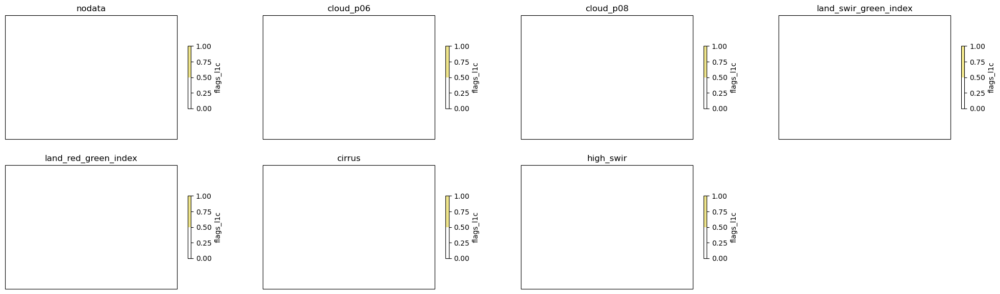

In [16]:
prod = xr.open_dataset(file)
str_epsg = str(prod.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
bcmap = mpl.colors.ListedColormap([(0,0,0,0),'khaki'])
fig = plt.figure(figsize=(25, 7))
flag_value=1
for ii,flag_name in enumerate(prod.flags_l1c.flag_names):
    ax = plt.subplot(2, 4, ii+1, projection=proj)
    ((prod.flags_l1c & flag_value) != 0).plot.imshow(ax=ax,cmap=bcmap,vmin=0,vmax=1,cbar_kwargs={'shrink':0.5})
    ax.set_title(flag_name)
    flag_value = flag_value << 1

In [19]:
date = dt.datetime.strptime(file.split('_')[-5],'%Y%m%dT%H%M%S')
date.strftime('%Y-%m')

'2018-10'

In [ ]:
process_ = grs.process()
process_.execute(l1c.prod,
            cams_file=cams_file,
            surfwater_file=None,
            dem_file=dem_file,
            scale_aot=1,
            opac_model='DESE_rh70')

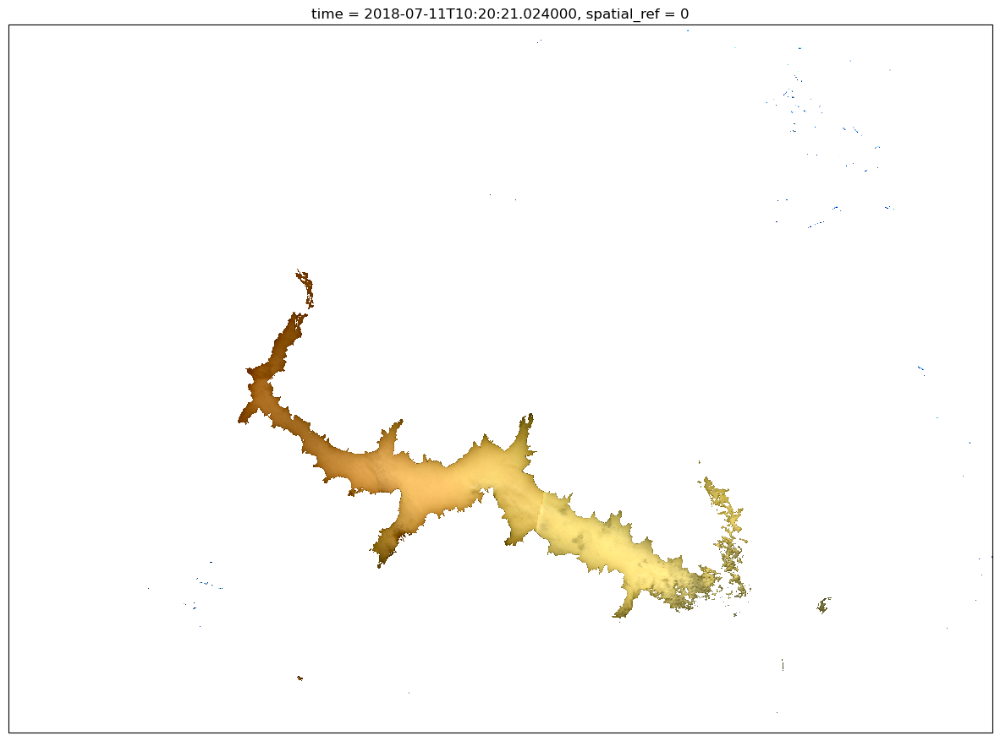

In [10]:
str_epsg = str(process_.l2a.l2_prod.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
bcmap = mpl.colors.ListedColormap([(0,0,0,0),'khaki'])
bcmap2 = mpl.colors.ListedColormap([(0,0,0,0),'red'])

plt.figure(figsize=(15,15))
process_.l2a.l2_prod.Rrs.sel(wl=[665,560,490]).plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection=proj))

In [14]:
v=visual.view_spectral(prod.raster.bands,reproject=True)
v.title="## S2 L1C"
v.minmaxvalues=(0,0.3)
v.minmax=[0,0.5]
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2021, ...], start=datetime.date(2021, ..., value=datetime.date(2021, ...)
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.5, name='Range Slider', step=0.0001, value=(0, 0.3), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(DynamicMap, height=800, sizing_mode='fixed', width=1200)

In [15]:
geom_ = v.get_geom(v.aoi_stream,crs=prod.raster.rio.crs)

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/duck_array_ops.py:188: RuntimeWarning: overflow encountered in cast
  return data.astype(dtype, **kwargs)


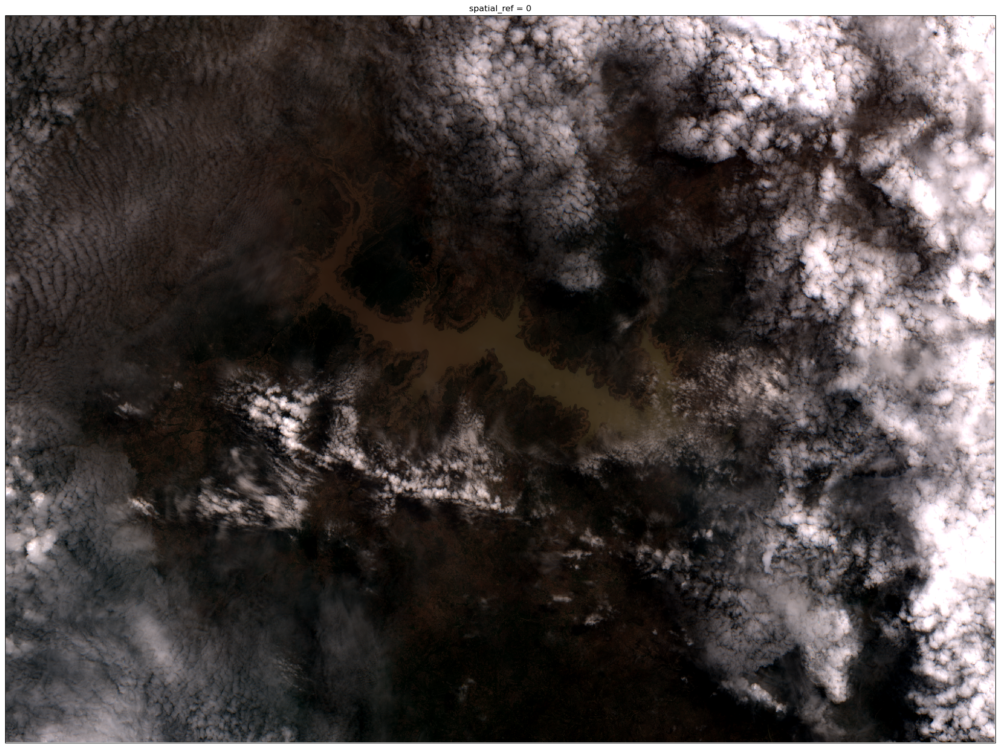

In [10]:

import cartopy.crs as ccrs
str_epsg = str(l1c.prod.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
plt.figure(figsize=(25,25))
l1c.prod.bands.sel(wl=[665,560,490]).plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection=proj))